In [1]:
#Importing Packages

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import os

# Load CSV into memory

In [2]:
files = os.listdir(r'C:\Users\91983\Downloads\uber.csv files\data analyst project')

In [3]:
files

['uber-raw-data-apr14.csv',
 'uber-raw-data-aug14.csv',
 'uber-raw-data-janjune-15.csv',
 'uber-raw-data-jul14.csv',
 'uber-raw-data-jun14.csv',
 'uber-raw-data-may14.csv',
 'uber-raw-data-sep14.csv']

In [4]:
files.remove('uber-raw-data-janjune-15.csv')

In [5]:
files

['uber-raw-data-apr14.csv',
 'uber-raw-data-aug14.csv',
 'uber-raw-data-jul14.csv',
 'uber-raw-data-jun14.csv',
 'uber-raw-data-may14.csv',
 'uber-raw-data-sep14.csv']

In [6]:
#Concatenate all the files to form our complete dataset

path = r'C:\Users\91983\Downloads\uber.csv files\data analyst project'

data = pd.DataFrame()
for file in files:
    df=pd.read_csv(path+'/'+file)
    data=pd.concat([data,df])

In [7]:
data.shape

(4534327, 4)

In [8]:
data.head()

,Date/Time,Lat,Lon,Base
0,4/1/2014 0:11:00,40.7690,-73.9549,B02512
1,4/1/2014 0:17:00,40.7267,-74.0345,B02512
2,4/1/2014 0:21:00,40.7316,-73.9873,B02512
3,4/1/2014 0:28:00,40.7588,-73.9776,B02512
4,4/1/2014 0:33:00,40.7594,-73.9722,B02512


In [9]:
data.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 4534327 entries, 0 to 1028135
Data columns (total 4 columns):
 #   Column     Dtype  
---  ------     -----  
 0   Date/Time  object 
 1   Lat        float64
 2   Lon        float64
 3   Base       object 
dtypes: float64(2), object(2)
memory usage: 173.0+ MB


In [10]:
#Checking for the missing values

data.isnull().sum()

Date/Time    0
Lat          0
Lon          0
Base         0
dtype: int64

In [11]:
data['Date/Time'] = pd.to_datetime(data['Date/Time'], format="%m/%d/%Y %H:%M:%S")

In [12]:
data['weekday']=data['Date/Time'].dt.day_name()
data['day']=data['Date/Time'].dt.day
data['minute']=data['Date/Time'].dt.minute
data['month']=data['Date/Time'].dt.month
data['hour']=data['Date/Time'].dt.hour

In [13]:
data.head()

,Date/Time,Lat,Lon,Base,weekday,day,minute,month,hour
0,2014-04-01 00:11:00,40.7690,-73.9549,B02512,Tuesday,1,11,4,0
1,2014-04-01 00:17:00,40.7267,-74.0345,B02512,Tuesday,1,17,4,0
2,2014-04-01 00:21:00,40.7316,-73.9873,B02512,Tuesday,1,21,4,0
3,2014-04-01 00:28:00,40.7588,-73.9776,B02512,Tuesday,1,28,4,0
4,2014-04-01 00:33:00,40.7594,-73.9722,B02512,Tuesday,1,33,4,0


In [14]:
data['weekday'].value_counts()

Thursday     755145
Friday       741139
Wednesday    696488
Tuesday      663789
Saturday     646114
Monday       541472
Sunday       490180
Name: weekday, dtype: int64

In [15]:
data['weekday'].value_counts().index

Index(['Thursday', 'Friday', 'Wednesday', 'Tuesday', 'Saturday', 'Monday',
       'Sunday'],
      dtype='object')

Text(0, 0.5, 'Traffic Count')

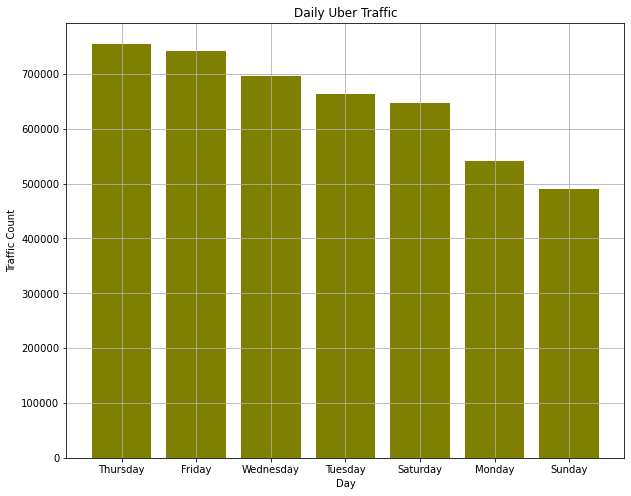

In [16]:
#plot to visualize UBER's daily traffic

x = data['weekday'].value_counts().index
y = data['weekday'].value_counts()

plt.figure(figsize=(10,8))
bars = plt.bar(x,y, color='olive',width=0.8)
plt.grid()
plt.title('Daily Uber Traffic')
plt.xlabel('Day')
plt.ylabel('Traffic Count')

#plt.plot(x, y, linewidth='2.0', color='white', marker='o', markersize='6')



After observing the the barchart we can conclude that the highest traffic faced by UBER is on Thursday and the lowest is on Sunday.

# Analysis of Journey by Hours

In [17]:
data['hour'].unique()

array([ 0,  1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11, 12, 13, 14, 15, 16,
       17, 18, 19, 20, 21, 22, 23], dtype=int64)

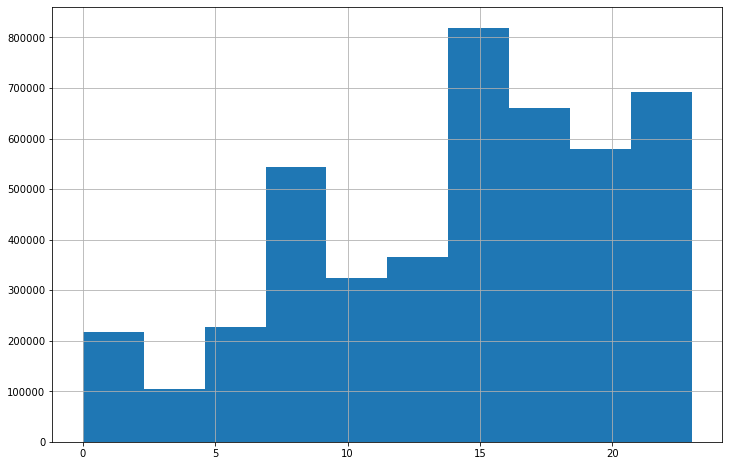

In [18]:
plt.figure(figsize=(12,8))
plt.hist(data['hour'])
plt.grid('white')

So as we can see UBER traffic generally peaks during night wen people log off from their work between 17:00 t0 22:00 hrs

# Analysis of Journeys by Month

In [19]:
data['month'].value_counts()

9    1028136
8     829275
7     796121
6     663844
5     652435
4     564516
Name: month, dtype: int64

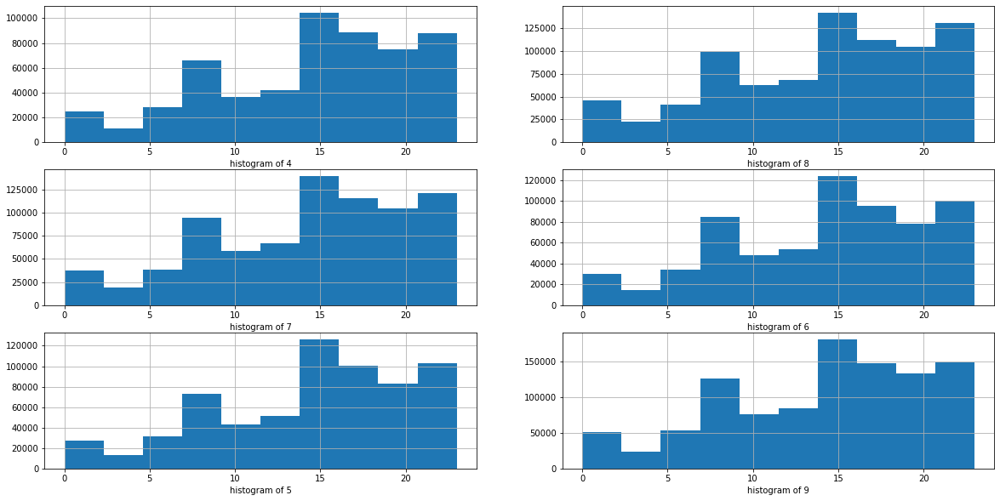

In [20]:
fig, ax = plt.subplots(5,4, figsize=(20,10))

for i,month in enumerate(data['month'].unique()):
    plt.subplot(3,2,i+1)
    data[data['month']==month]['hour'].hist()
    plt.xlabel('histogram of {}'.format(month))
   
    

for all month UBER traffic peak during late hours only

In [21]:
data.groupby('month')['hour'].sum()

month
4     8165748
5     9448974
6     9386939
7    11321420
8    11658535
9    14488851
Name: hour, dtype: int64

Text(0, 0.5, 'Traffic count')

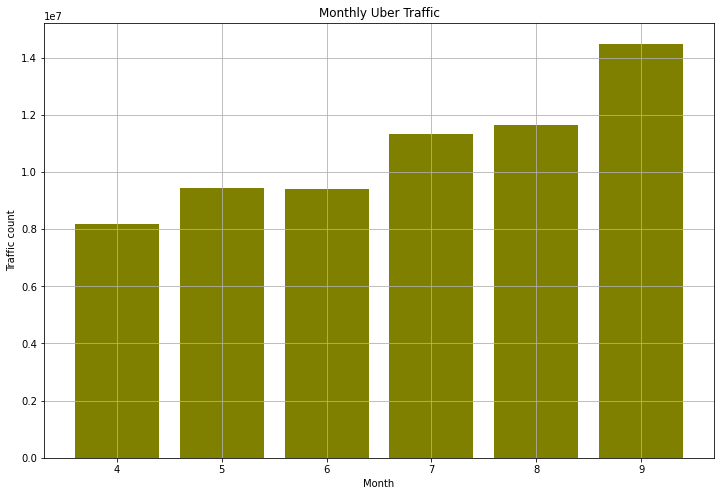

In [22]:
x = data.groupby('month')['hour'].sum().index
y = data.groupby('month')['hour'].sum()

plt.figure(figsize=(12,8))
bars = plt.bar(x,y, color='olive', width=0.8)
plt.grid()
plt.title('Monthly Uber Traffic')
plt.xlabel('Month')
plt.ylabel('Traffic count')
#plt.plot(x, y, linewidth='2.0', color='black', marker='o', markersize='6')

In the 9th Month i.e. september uber records the highest traffic

In [23]:
data.head()

,Date/Time,Lat,Lon,Base,weekday,day,minute,month,hour
0,2014-04-01 00:11:00,40.7690,-73.9549,B02512,Tuesday,1,11,4,0
1,2014-04-01 00:17:00,40.7267,-74.0345,B02512,Tuesday,1,17,4,0
2,2014-04-01 00:21:00,40.7316,-73.9873,B02512,Tuesday,1,21,4,0
3,2014-04-01 00:28:00,40.7588,-73.9776,B02512,Tuesday,1,28,4,0
4,2014-04-01 00:33:00,40.7594,-73.9722,B02512,Tuesday,1,33,4,0


<AxesSubplot:xlabel='hour', ylabel='Lat'>

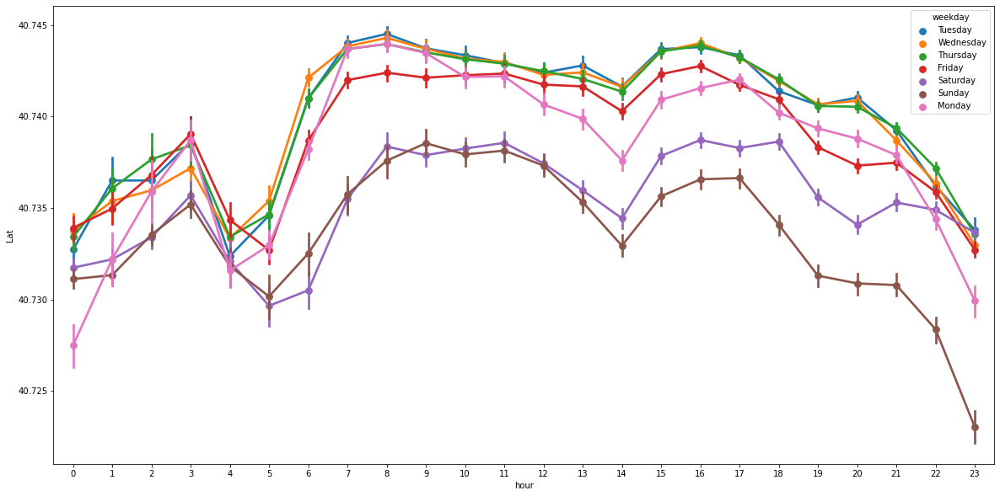

In [24]:
#Rush everyhour of day with pickup latitude of passenger
plt.figure(figsize=(20,10))
sns.pointplot(x='hour',y='Lat',hue='weekday',data=data)

We can observe from the above pointplot that the lowest traffic is on sunday and the Highest Traffic is between Tuesday to Thursday

Also we can visualize from here max traffic for a particular day has been from what Location and during which hour of the day.

In [25]:
data['Base'].value_counts()

B02617    1458853
B02598    1393113
B02682    1212789
B02764     263899
B02512     205673
Name: Base, dtype: int64

<AxesSubplot:xlabel='month', ylabel='count'>

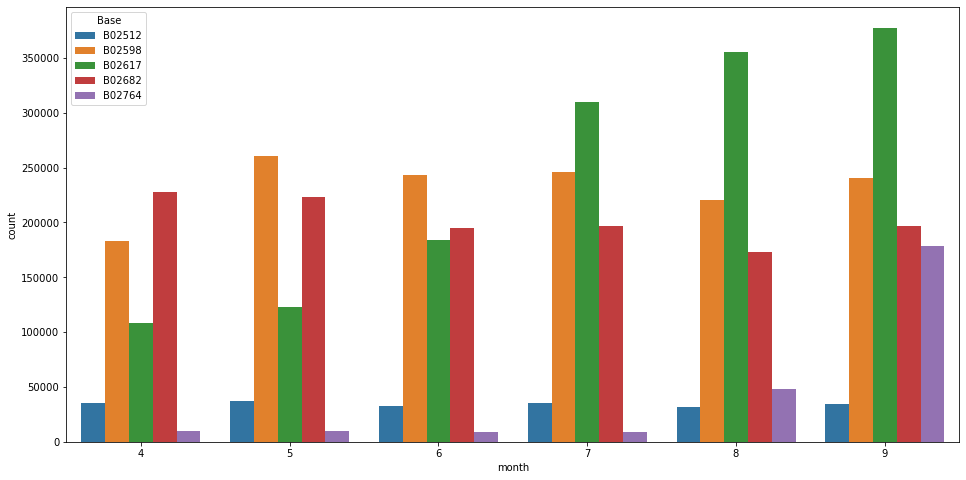

In [26]:
plt.figure(figsize=(16,8))
sns.countplot(x='month',hue='Base',data=data)

In [27]:
base = data.groupby(['Base','month'])['Date/Time'].count().reset_index()
base

,Base,month,Date/Time
0,B02512,4,35536
1,B02512,5,36765
2,B02512,6,32509
3,B02512,7,35021
4,B02512,8,31472
5,B02512,9,34370
6,B02598,4,183263
7,B02598,5,260549
8,B02598,6,242975
9,B02598,7,245597


<AxesSubplot:xlabel='month', ylabel='Date/Time'>

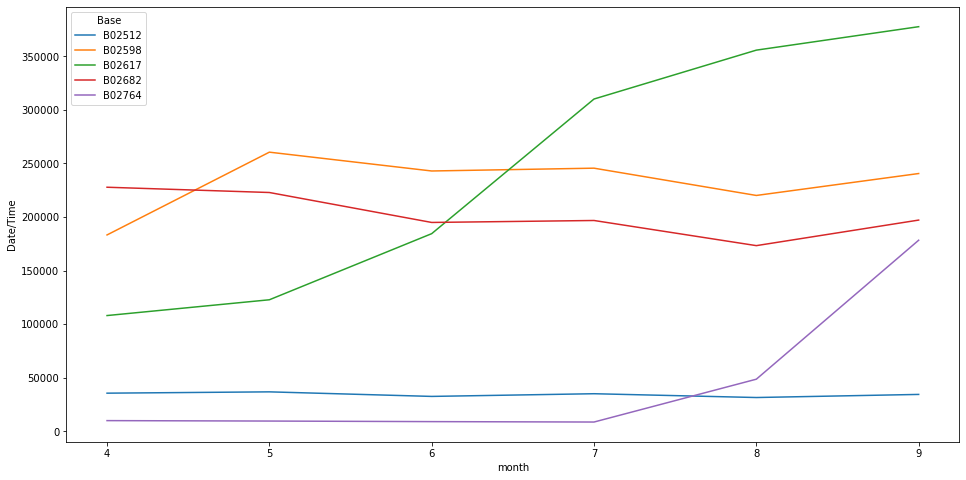

In [28]:
plt.figure(figsize=(16,8))
sns.lineplot(x='month',y='Date/Time',hue='Base',data=base)

we can clearly see that the green line in lineplot 'B02617' get increased every month

In [29]:
x = data.groupby(['weekday','hour'])['Date/Time'].count()
x

weekday    hour
Friday     0       13716
           1        8163
           2        5350
           3        6930
           4        8806
                   ...  
Wednesday  19      47017
           20      47772
           21      44553
           22      32868
           23      18146
Name: Date/Time, Length: 168, dtype: int64

In [30]:
pivot = x.unstack()
pivot

hour,0,1,2,3,4,5,6,7,8,9,...,14,15,16,17,18,19,20,21,22,23
weekday,,,,,,,,,,,,,,,,,,,,,
Friday,13716,8163,5350,6930,8806,13450,23412,32061,31509,25230,...,36206,43673,48169,51961,54762,49595,43542,48323,49409,41260
Monday,6436,3737,2938,6232,9640,15032,23746,31159,29265,22197,...,28157,32744,38770,42023,37000,34159,32849,28925,20158,11811
Saturday,27633,19189,12710,9542,6846,7084,8579,11014,14411,17669,...,31418,38769,43512,42844,45883,41098,38714,43826,47951,43174
Sunday,32877,23015,15436,10597,6374,6169,6596,8728,12128,16401,...,28151,31112,33038,31521,28291,25948,25076,23967,19566,12166
Thursday,9293,5290,3719,5637,8505,14169,27065,37038,35431,27812,...,36699,44442,50560,56704,55825,51907,51990,51953,44194,27764
Tuesday,6237,3509,2571,4494,7548,14241,26872,36599,33934,25023,...,34846,41338,48667,55500,50186,44789,44661,39913,27712,14869
Wednesday,7644,4324,3141,4855,7511,13794,26943,36495,33826,25635,...,35148,43388,50684,55637,52732,47017,47772,44553,32868,18146


In [31]:
# Build Function to check relationship b/w different Date/Time parameters
def count_rows(rows):
    return len(rows)
def heatmap(col1,col2):
    cross_table=data.groupby([col1,col2]).apply(count_rows)
    pivot = cross_table.unstack()
    plt.figure(figsize=(16,8))
    return sns.heatmap(pivot, annot=False,cmap="YlGnBu")

<AxesSubplot:xlabel='hour', ylabel='weekday'>

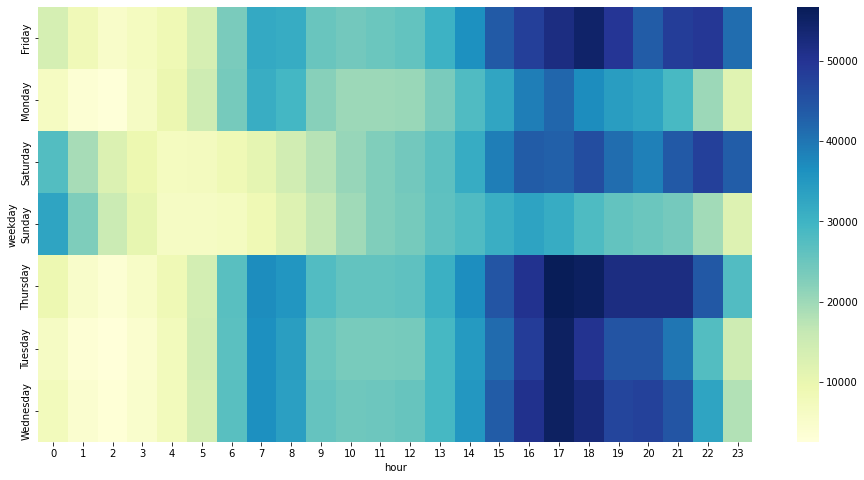

In [32]:
heatmap('weekday','hour')

On each day of week, maximum traffic is late hours in evening 

<AxesSubplot:xlabel='hour', ylabel='day'>

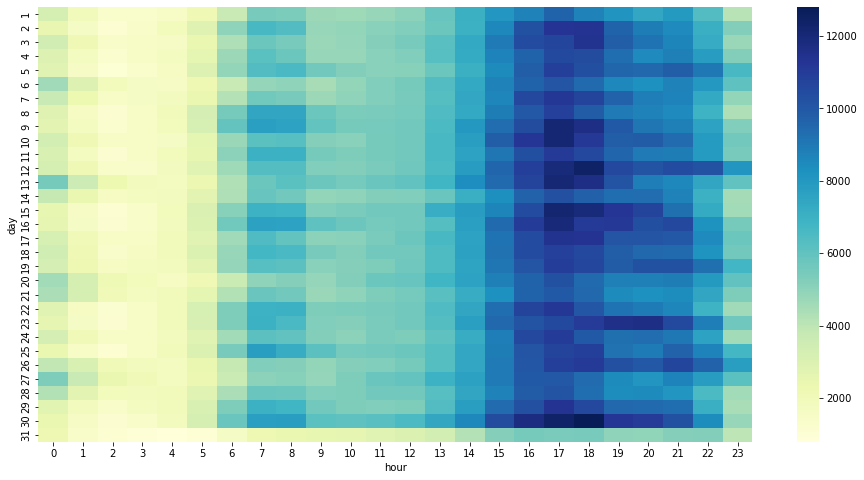

In [33]:
heatmap('day','hour')

<AxesSubplot:xlabel='month', ylabel='day'>

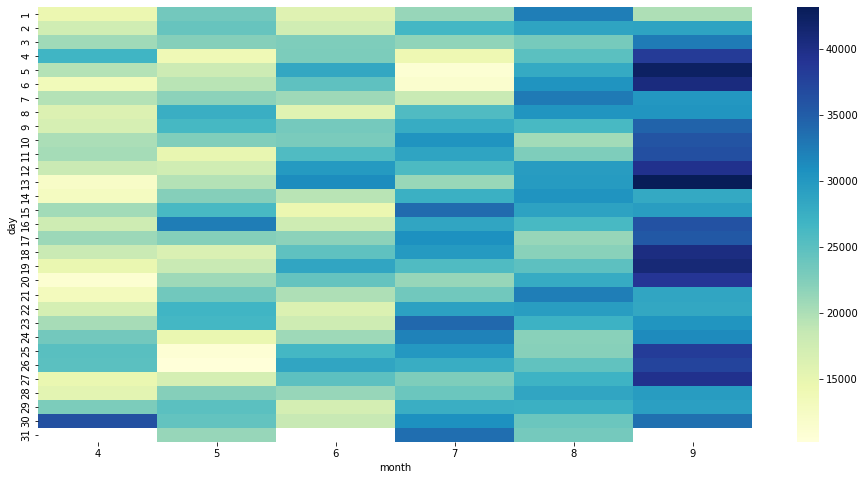

In [34]:
heatmap('day','month')

Numbers of Trips increased each month,so we can say from April to September UBER was in a continous improvement process

In [35]:
data.head()

,Date/Time,Lat,Lon,Base,weekday,day,minute,month,hour
0,2014-04-01 00:11:00,40.7690,-73.9549,B02512,Tuesday,1,11,4,0
1,2014-04-01 00:17:00,40.7267,-74.0345,B02512,Tuesday,1,17,4,0
2,2014-04-01 00:21:00,40.7316,-73.9873,B02512,Tuesday,1,21,4,0
3,2014-04-01 00:28:00,40.7588,-73.9776,B02512,Tuesday,1,28,4,0
4,2014-04-01 00:33:00,40.7594,-73.9722,B02512,Tuesday,1,33,4,0


# Analysis of Lat/Long data points

(40.6, 41.0)

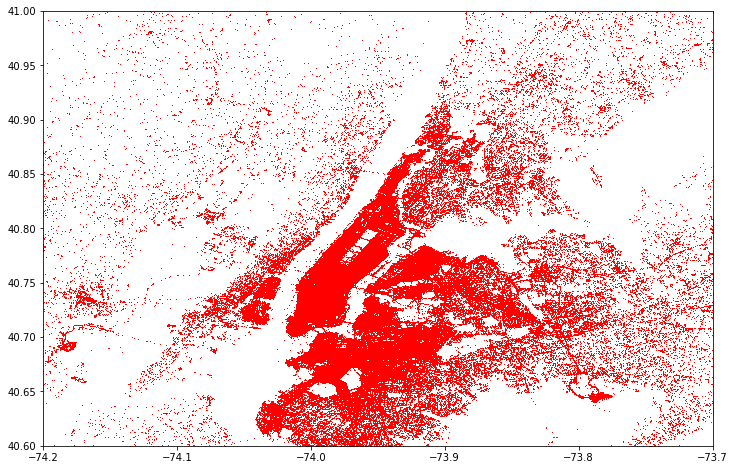

In [49]:
#Analysis of lat/long data points
plt.figure(figsize=(12,8))

plt.plot(data['Lon'],data['Lat'],'r+', ms=0.8)
#removing outliners
plt.xlim(-74.2,-73.7)
plt.ylim(40.6,41)

We can observe the number of heatpoints here and the particular location areas where there has been hoge demand for the given period

# Spatial Analysis using Heatmap to analyze  clear cut Rush on Sunday on Map

In [54]:
data_sun = data[data['weekday']=='Sunday']
data_sun

,Date/Time,Lat,Lon,Base,weekday,day,minute,month,hour
6965,2014-04-06 00:00:00,40.6547,-74.3033,B02512,Sunday,6,0,4,0
6966,2014-04-06 00:00:00,40.7356,-74.0006,B02512,Sunday,6,0,4,0
6967,2014-04-06 00:00:00,40.7421,-74.0041,B02512,Sunday,6,0,4,0
6968,2014-04-06 00:00:00,40.7401,-74.0053,B02512,Sunday,6,0,4,0
6969,2014-04-06 00:01:00,40.7368,-73.9877,B02512,Sunday,6,1,4,0
...,...,...,...,...,...,...,...,...,...
1014138,2014-09-28 23:57:00,40.6447,-73.7821,B02764,Sunday,28,57,9,23
1014139,2014-09-28 23:57:00,40.7513,-73.9941,B02764,Sunday,28,57,9,23
1014140,2014-09-28 23:57:00,40.6875,-74.1824,B02764,Sunday,28,57,9,23
1014141,2014-09-28 23:57:00,40.6482,-73.7823,B02764,Sunday,28,57,9,23


In [55]:
rush = data_sun.groupby(['Lat','Lon'])['weekday'].count().reset_index()
rush

,Lat,Lon,weekday
0,39.9374,-74.0722,1
1,39.9378,-74.0721,1
2,39.9384,-74.0742,1
3,39.9385,-74.0734,1
4,39.9415,-74.0736,1
...,...,...,...
209225,41.3141,-74.1249,1
209226,41.3180,-74.1298,1
209227,41.3195,-73.6905,1
209228,41.3197,-73.6903,1


In [59]:
import folium
from folium.plugins import HeatMap
basemap=folium.Map()

In [61]:
HeatMap(rush,zoom=20,radius=15).add_to(basemap)
basemap